# Interactive Animated Sine Waves with Axis Sliders
This notebook demonstrates an animated plot of two sine waves and their product, with interactive sliders to adjust the axis limits. For best results, run this notebook in JupyterLab or Jupyter Notebook.

In [1]:
%matplotlib notebook
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import ipywidgets as widgets
from IPython.display import display, clear_output, HTML
from numpy.fft import fft, ifft

# Widgets
n = widgets.IntSlider(min=1, max=10, step=1, value=2, description='# of Waves')
v = widgets.FloatText(min=0, max=10, step=0.01, value=1, description='Velocity')
s = widgets.Checkbox(description='Sync By Velocity', value=False, indent=False)
g = widgets.Checkbox(description='Split Graphs', value=True, indent=False)  # Split graphs checkbox
master_box = widgets.HBox([n, v, s, g])
display(master_box)

# Columns for sliders
a_column = widgets.VBox()
ω_column = widgets.VBox()
k_column = widgets.VBox()
sliders_box = widgets.HBox([a_column, ω_column, k_column])

# Container for all sliders
gridsliders_box = widgets.HBox([sliders_box])
display(gridsliders_box)

# Line sliders
line_sliders = []

# Function to make sliders
def make_sliders(index):
    a = widgets.FloatSlider(min=0, max=10, step=0.01, description=f'a{index}')
    ω = widgets.FloatSlider(min=0, max=10, step=1, description=f'ω{index}')
    k = widgets.FloatSlider(min=0, max=10, step=1, description=f'k{index}')
    sync = {'ω': False, 'k': False}

    def update_ω(change):
        if not s.value or sync['k']:
            return
        sync['ω'] = True
        k.value = ω.value / v.value if v.value != 0 else 0.01
        sync['ω'] = False

    def update_k(change):
        if not s.value or sync['ω']:
            return
        sync['k'] = True
        ω.value = k.value * v.value
        sync['k'] = False

    ω.observe(update_ω, names='value')
    k.observe(update_k, names='value')

    return {'a': a, 'ω': ω, 'k': k}

# Update sliders
def update_sliders(change=None):
    a_column.children = []
    ω_column.children = []
    k_column.children = []
    line_sliders.clear()
    for i in range(n.value):
        sliders = make_sliders(i + 1)
        line_sliders.append(sliders)
        a_column.children += (sliders['a'],)
        ω_column.children += (sliders['ω'],)
        k_column.children += (sliders['k'],)

n.observe(update_sliders, names='value')
update_sliders(None)

# Generate wave button
start = widgets.Button(description="Generate Wave")
fileupload = widgets.FileUpload(accept='.h5', multiple=False, description='Upload .h5 File')
makers = widgets.HBox([fileupload, start])
display(makers)

# Start animation function
def started(b):
    clear_output(wait=True)
    display(master_box)
    display(gridsliders_box)
    display(start)
    speed_output = widgets.Output()
    display(speed_output)

    # Data setup
    x = np.linspace((-n.value * 10), (n.value * 10), 800)
    individual_lines = []
    colors = plt.cm.viridis(np.linspace(0, 1, len(line_sliders)))

    if g.value:
        fig_combined, ax_combined = plt.subplots(figsize=(10, 4))
        ax_combined.set_xlim(0, 10)
        ax_combined.set_ylim(-(n.value * 10), (n.value * 10))
        line_sum, = ax_combined.plot(x, np.zeros_like(x), color='green', label='Combined Wave')
        ax_combined.set_title('Combined Wave')
        ax_combined.set_xlabel('x')
        ax_combined.set_ylabel('u(x)')
        ax_combined.legend(loc='upper right')

        fig_individual, ax_individual = plt.subplots(figsize=(10, 4))
        ax_individual.set_xlim(0, 10)
        ax_individual.set_ylim(-(n.value * 10), (n.value * 10))
        ax_individual.set_title('Individual Waves')
        ax_individual.set_xlabel('x')
        ax_individual.set_ylabel('u(x)')

        for i, sliders in enumerate(line_sliders):
            line, = ax_individual.plot(x, np.zeros_like(x), color=colors[i], label=f'Wave {i+1}')
            individual_lines.append(line)
        ax_individual.legend(loc='upper right')

    else:
        # --- Combined + Individual Waves in Same Plot ---
        fig_combined, ax_combined = plt.subplots(figsize=(10, 4))
        ax_combined.set_xlim(0, 10)
        ax_combined.set_ylim(-(n.value * 10), (n.value * 10))
        ax_combined.set_title('Combined + Individual Waves')
        ax_combined.set_xlabel('x')
        ax_combined.set_ylabel('u(x)')
        line_sum, = ax_combined.plot(x, np.zeros_like(x), color='green', label='Combined Wave')

        for i, sliders in enumerate(line_sliders):
            line, = ax_combined.plot(x, np.zeros_like(x), color=colors[i], label=f'Wave {i+1}')
            individual_lines.append(line)
        ax_combined.legend(loc='upper right')

    # Animation update
    def update(frame):
        y_total = np.zeros_like(x)
        for i, sliders in enumerate(line_sliders):
            a = sliders['a'].value
            ω = sliders['ω'].value
            k = sliders['k'].value
            equation = (k * frame) - (ω * x)
            y = a * np.sin(equation)
            y_total += y
            individual_lines[i].set_ydata(y)
        line_sum.set_ydata(y_total)
        return (line_sum, *individual_lines)

    ani = animation.FuncAnimation(fig_combined, update, frames=150, interval=200, blit=True)
    display(HTML(ani.to_jshtml()))

    if g.value:
        ani2 = animation.FuncAnimation(fig_individual, update, frames=150, interval=200, blit=True)
        display(HTML(ani2.to_jshtml()))

    # Fourier Transform
    y = update(150)[0].get_ydata()
    Y = np.fft.fft(y)
    dx = x[1] - x[0]
    freqs = np.fft.fftfreq(len(x), d=dx)
    omega_freqs = 2 * np.pi * freqs
    half = len(x) // 2
    fig_fft, ax_fft = plt.subplots(figsize=(6, 4))
    ax_fft.plot(omega_freqs[:half], np.abs(Y[:half]), color='blue')
    ax_fft.set_title("Fourier Transform of Combined Wave")
    ax_fft.set_xlabel("Angular Frequency (rad/s)")
    ax_fft.set_ylabel("Amplitude")
    ax_fft.set_xlim(0, 12)
    ax_fft.grid(True)
    display(fig_fft)

# Connect button
start.on_click(started)

#omega = c k_x


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

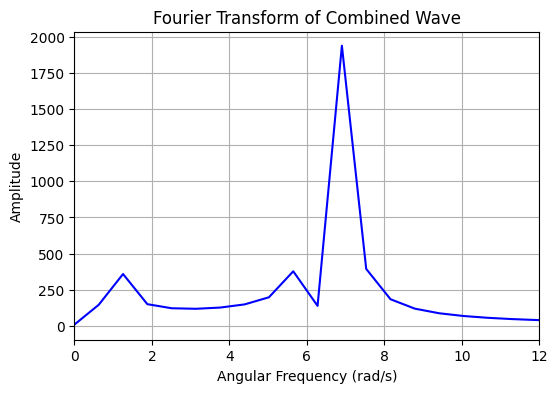

In [ ]:
%matplotlib notebook
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import ipywidgets as widgets
from IPython.display import display, clear_output, HTML

# Fixed number of waves
NUM_WAVES = 3

# Widgets
v = widgets.FloatText(min=0, max=10, step=0.01, value=1, description='Velocity')
s = widgets.Checkbox(description='Sync By Velocity', value=False, indent=False)
g = widgets.Checkbox(description='Split Graphs', value=True, indent=False)

master_box = widgets.HBox([v, s, g])
display(master_box)

# Columns for sliders
a_column = widgets.VBox()
ω_column = widgets.VBox()
k_column = widgets.VBox()
sliders_box = widgets.HBox([a_column, ω_column, k_column])
display(sliders_box)

# Line sliders list
line_sliders = []

def make_sliders(index):
    a = widgets.FloatSlider(min=0, max=10, step=0.01, value=1, description=f'a{index}')
    ω = widgets.FloatSlider(min=0, max=10, step=1, value=1, description=f'ω{index}')
    k = widgets.FloatSlider(min=0, max=10, step=1, value=1, description=f'k{index}')
    sync = {'ω': False, 'k': False}

    # Velocity sync for each wave
    def update_ω(change):
        if not s.value or sync['k']:
            return
        sync['ω'] = True
        k.value = ω.value / v.value if v.value != 0 else 0.01
        sync['ω'] = False

    def update_k(change):
        if not s.value or sync['ω']:
            return
        sync['k'] = True
        ω.value = k.value * v.value
        sync['k'] = False

    ω.observe(update_ω, names='value')
    k.observe(update_k, names='value')

    return {'a': a, 'ω': ω, 'k': k}

def update_sliders():
    a_column.children = ()
    ω_column.children = ()
    k_column.children = ()
    line_sliders.clear()
    for i in range(NUM_WAVES):
        sliders = make_sliders(i + 1)
        line_sliders.append(sliders)
        a_column.children += (sliders['a'],)
        ω_column.children += (sliders['ω'],)
        k_column.children += (sliders['k'],)

update_sliders()

# Automatically sync wave 3 as difference of wave 1 and 2
def setup_diff_sync():
    if len(line_sliders) < 3:
        return
    
    w1_ω, w2_ω, w3_ω = line_sliders[0]['ω'], line_sliders[1]['ω'], line_sliders[2]['ω']
    w1_k, w2_k, w3_k = line_sliders[0]['k'], line_sliders[1]['k'], line_sliders[2]['k']

    # Disable manual editing of wave 3 ω and k
    w3_ω.disabled = True
    w3_k.disabled = True

    def update_ω3(change=None):
        w3_ω.value = w1_ω.value - w2_ω.value

    def update_k3(change=None):
        w3_k.value = w1_k.value - w2_k.value

    # Attach observers to wave 1 and 2 to update wave 3 automatically
    w1_ω.observe(update_ω3, names='value')
    w2_ω.observe(update_ω3, names='value')
    w1_k.observe(update_k3, names='value')
    w2_k.observe(update_k3, names='value')

    # Initialize wave 3 values
    update_ω3()
    update_k3()

setup_diff_sync()

# Generate wave button
start = widgets.Button(description="Generate Wave")
fileupload = widgets.FileUpload(accept='.h5', multiple=False, description='Upload .h5 File')
makers = widgets.HBox([fileupload, start])
display(makers)

# Animation start function
def started(b):
    clear_output(wait=True)
    display(master_box)
    display(sliders_box)
    display(makers)

    # Data setup
    x = np.linspace(0, 10, 800)
    individual_lines = []
    colors = plt.cm.viridis(np.linspace(0, 1, NUM_WAVES))

    if g.value:
        fig_combined, ax_combined = plt.subplots(figsize=(10, 4))
        ax_combined.set_xlim(0, 10)
        ax_combined.set_ylim(-(NUM_WAVES * 10), (NUM_WAVES * 10))
        line_sum, = ax_combined.plot(x, np.zeros_like(x), color='green', label='Combined Wave')
        ax_combined.set_title('Combined Wave')
        ax_combined.set_xlabel('x')
        ax_combined.set_ylabel('u(x)')
        ax_combined.legend(loc='upper right')

        fig_individual, ax_individual = plt.subplots(figsize=(10, 4))
        ax_individual.set_xlim(0, 10)
        ax_individual.set_ylim(-(NUM_WAVES * 10), (NUM_WAVES * 10))
        ax_individual.set_title('Individual Waves')
        ax_individual.set_xlabel('x')
        ax_individual.set_ylabel('u(x)')

        for i, sliders in enumerate(line_sliders):
            line, = ax_individual.plot(x, np.zeros_like(x), color=colors[i], label=f'Wave {i+1}')
            individual_lines.append(line)
        ax_individual.legend(loc='upper right')

    else:
        fig_combined, ax_combined = plt.subplots(figsize=(10, 4))
        ax_combined.set_xlim(0, 10)
        ax_combined.set_ylim(-(NUM_WAVES * 10), (NUM_WAVES * 10))
        ax_combined.set_title('Combined + Individual Waves')
        ax_combined.set_xlabel('x')
        ax_combined.set_ylabel('u(x)')
        line_sum, = ax_combined.plot(x, np.zeros_like(x), color='green', label='Combined Wave')

        for i, sliders in enumerate(line_sliders):
            line, = ax_combined.plot(x, np.zeros_like(x), color=colors[i], label=f'Wave {i+1}')
            individual_lines.append(line)
        ax_combined.legend(loc='upper right')

    # Animation update function
    def update(frame):
        y_total = np.zeros_like(x)
        for i, sliders in enumerate(line_sliders):
            a = sliders['a'].value
            ω = sliders['ω'].value
            k = sliders['k'].value
            equation = (k * frame) - (ω * x)
            y = a * np.sin(equation)
            y_total += y
            individual_lines[i].set_ydata(y)
        line_sum.set_ydata(y_total)
        return (line_sum, *individual_lines)

    ani = animation.FuncAnimation(fig_combined, update, frames=150, interval=200, blit=True)
    display(HTML(ani.to_jshtml()))

    if g.value:
        ani2 = animation.FuncAnimation(fig_individual, update, frames=150, interval=200, blit=True)
        display(HTML(ani2.to_jshtml()))

    # Fourier Transform plot
    y = update(150)[0].get_ydata()
    Y = np.fft.fft(y)
    dx = x[1] - x[0]
    freqs = np.fft.fftfreq(len(x), d=dx)
    omega_freqs = 2 * np.pi * freqs
    half = len(x) // 2
    fig_fft, ax_fft = plt.subplots(figsize=(6, 4))
    ax_fft.plot(omega_freqs[:half], np.abs(Y[:half]), color='blue')
    ax_fft.set_title("Fourier Transform of Combined Wave")
    ax_fft.set_xlabel("Angular Frequency (rad/s)")
    ax_fft.set_ylabel("Amplitude")
    ax_fft.set_xlim(0, 12)
    ax_fft.grid(True)
    display(fig_fft)

# Connect button click
start.on_click(started)
